<a href="https://colab.research.google.com/github/Rafia-Shaikh-eng/Data-Science-Projects/blob/master/EDA_Rented_Bikes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
train=pd.read_csv('train.csv')

### Data Fields
<ul>
<li> datetime - hourly date + timestamp </li>
<li> season -  1 = spring, 2 = summer, 3 = fall, 4 = winter </li>
<li> holiday - whether the day is considered a holiday</li>
<li>workingday - whether the day is neither a weekend nor holiday</li>
<li> 
<ol>weather - 
<li>Clear, Few clouds, Partly cloudy, Partly cloudy</li>
<li>Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist</li>
<li>Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds</li>
<li>Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog </ol></li>
<li>temp - temperature in Celsius</li>
<li>atemp - "feels like" temperature in Celsius</li>
<li>humidity - relative humidity</li>
<li>windspeed - wind speed</li>
<li>casual - number of non-registered user rentals initiated</li>
<li>registered - number of registered user rentals initiated</li>
<li>count - number of total rentals</li>
</ul>


In [3]:
train.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1


In [4]:
def convert_date(df):
    
    
    df['datetime'] = pd.to_datetime(df['datetime'])
    df['month'] = df['datetime'].dt.month
    df['hour'] = df['datetime'].dt.hour
    df['weekday'] = df['datetime'].dt.dayofweek
    df["day"]=df["datetime"].dt.day
    df["year"]=df["datetime"].dt.year
    df['dayofweek'] = df['datetime'].dt.dayofweek
    df['month_start'] = df['datetime'].dt.is_month_start
    df['woy'] = df['datetime'].dt.isocalendar().week.astype(int)
    
    return df

In [5]:
convert_date(train)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,month,hour,weekday,day,year,dayofweek,month_start,woy
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0000,3,13,16,1,0,5,1,2011,5,True,52
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0000,8,32,40,1,1,5,1,2011,5,True,52
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0000,5,27,32,1,2,5,1,2011,5,True,52
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0000,3,10,13,1,3,5,1,2011,5,True,52
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0000,0,1,1,1,4,5,1,2011,5,True,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10881,2012-12-19 19:00:00,4,0,1,1,15.58,19.695,50,26.0027,7,329,336,12,19,2,19,2012,2,False,51
10882,2012-12-19 20:00:00,4,0,1,1,14.76,17.425,57,15.0013,10,231,241,12,20,2,19,2012,2,False,51
10883,2012-12-19 21:00:00,4,0,1,1,13.94,15.910,61,15.0013,4,164,168,12,21,2,19,2012,2,False,51
10884,2012-12-19 22:00:00,4,0,1,1,13.94,17.425,61,6.0032,12,117,129,12,22,2,19,2012,2,False,51


In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 20 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   datetime     10886 non-null  datetime64[ns]
 1   season       10886 non-null  int64         
 2   holiday      10886 non-null  int64         
 3   workingday   10886 non-null  int64         
 4   weather      10886 non-null  int64         
 5   temp         10886 non-null  float64       
 6   atemp        10886 non-null  float64       
 7   humidity     10886 non-null  int64         
 8   windspeed    10886 non-null  float64       
 9   casual       10886 non-null  int64         
 10  registered   10886 non-null  int64         
 11  count        10886 non-null  int64         
 12  month        10886 non-null  int64         
 13  hour         10886 non-null  int64         
 14  weekday      10886 non-null  int64         
 15  day          10886 non-null  int64         
 16  year

### EDA

In [7]:
from pandas_profiling import ProfileReport

In [8]:
ProfileReport= ProfileReport(train , title ='pandas profiling report')

In [9]:
ProfileReport

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
# Export html report
ProfileReport.to_file("train_profiling_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

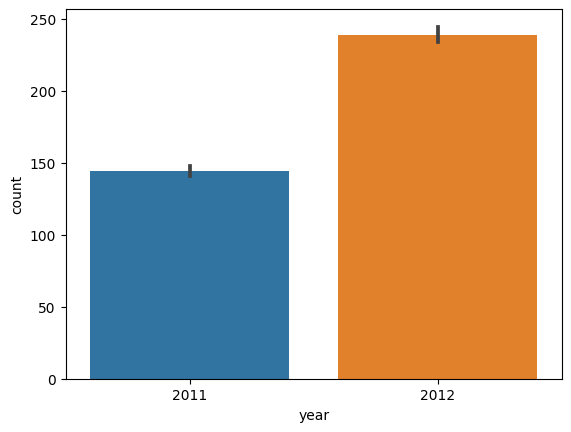

In [36]:
#plt.figure(figsize=(14,14))
#compare the count of rental bike in two years (2011 and 2012)
sns.barplot(data=train, x='year', y=train['count']);

The bar graph above illustrates that the number of rented bikes increased by 66.67%.

---



---



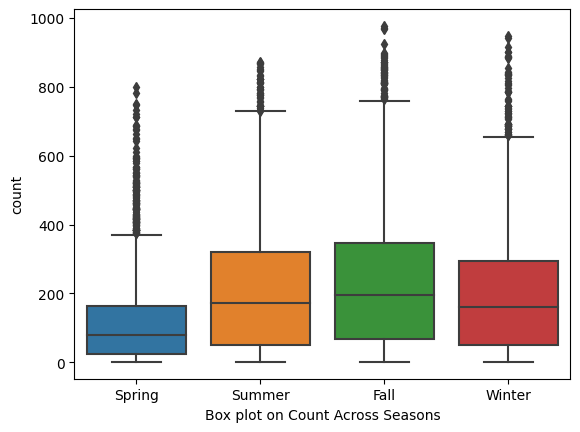

In [13]:
sns.boxplot(x="season",y="count",data=train)
plt.xlabel("Box plot on Count Across Seasons")
# labels for the x-axis
seasons = ['Spring', 'Summer', 'Fall', 'Winter']
plt.xticks([0,1,2,3],seasons)
plt.show()

The box plot shows that the average number of rented bikes during the fall season was around 210, slightly higher than in the summer. However, the spring season had the lowest average number of rented bikes at around 100.


---



---



Text(0.5, 1.0, 'Number of rented bike per season')

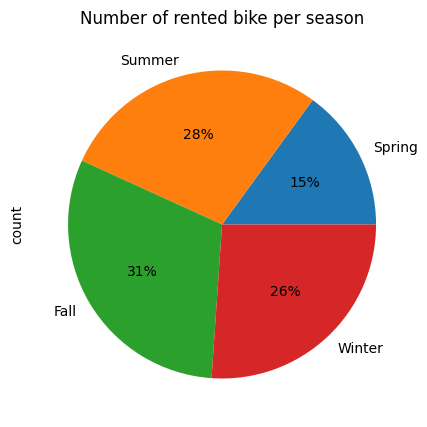

In [39]:
plt.figure(figsize=(5,5))
labels=['Spring', 'Summer', 'Fall', 'Winter']
train.groupby('season').sum()['count'].plot.pie(labels = labels, autopct='%.0f%%')
plt.title("Number of rented bike per season")

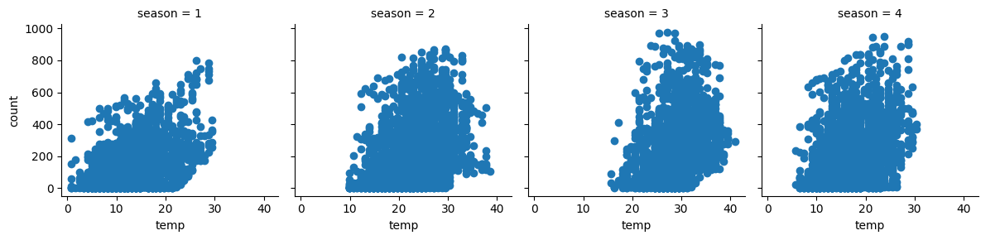

In [69]:
sns.FacetGrid(data = train, col = 'season').map(plt.scatter, 'temp', 'count').add_legend()
plt.show()

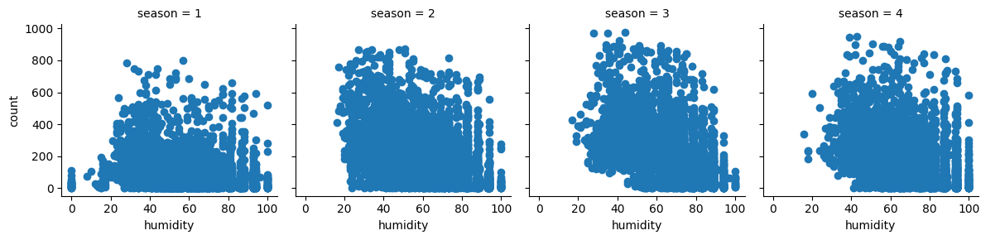

In [35]:
sns.FacetGrid(data = train, col = 'season').map(plt.scatter, 'humidity', 'count').add_legend()
plt.show()

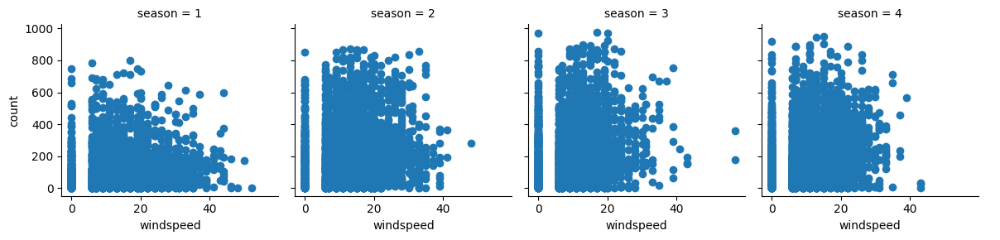

In [37]:
sns.FacetGrid(data = train, col = 'season').map(plt.scatter, 'windspeed', 'count').add_legend()
plt.show()

In [56]:
train.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'count',
       'month', 'hour', 'weekday', 'day', 'year', 'dayofweek', 'month_start',
       'woy'],
      dtype='object')

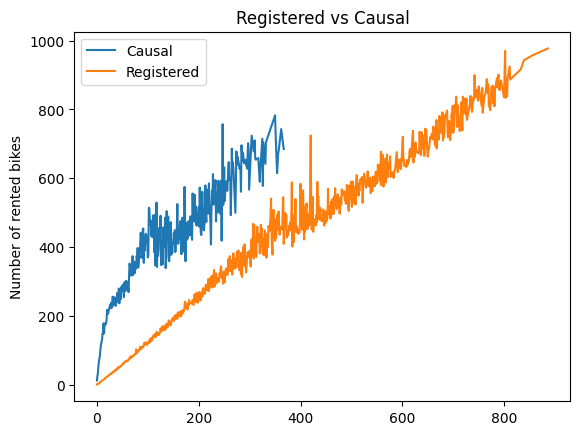

In [52]:
#compare registered and causual no. of rental bikes
# train.groupby('casual').sum()['count'].plot.bar()

train.groupby('casual').mean()['count'].plot.line()
train.groupby('registered').mean()['count'].plot.line()
plt.title('Registered vs Causal')
plt.ylabel('Number of rented bikes')
plt.xlabel('')
plt.legend(['Causal','Registered'])

The number of registered customers was twice that of the casual.


---



---



Text(0, 0.5, 'Number of rented bikes')

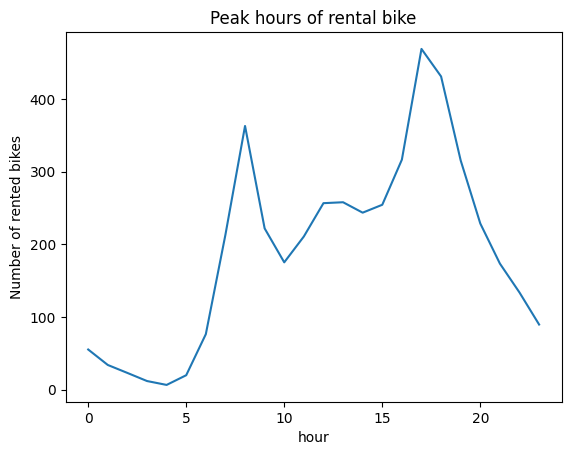

In [72]:
#pick hour of the rental bike
train.groupby('hour').mean()['count'].plot.line()
plt.title('Peak hours of rental bike')
plt.ylabel('Number of rented bikes')

The line graph shows that the peak hours for renting bikes are between 5 to 10 and 15 to 20.


---



---



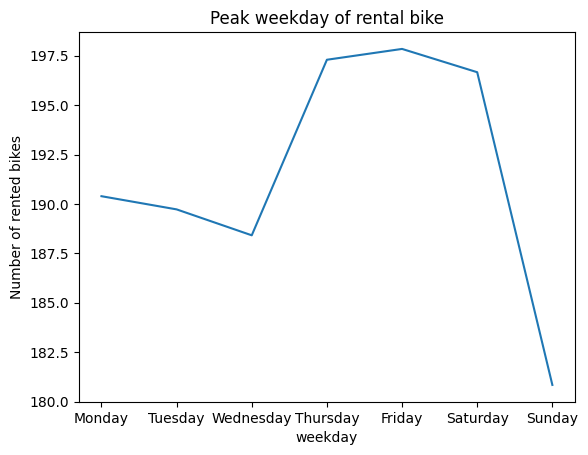

In [73]:
#pick weekday of the rental bike
train.groupby('weekday').mean()['count'].plot.line()
plt.title('Peak weekday of rental bike')
plt.ylabel('Number of rented bikes')
plt.xticks(range(0,7),['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.show()

The line graph shows that the peak days for renting bikes are from Wednesday to Sunday.


---



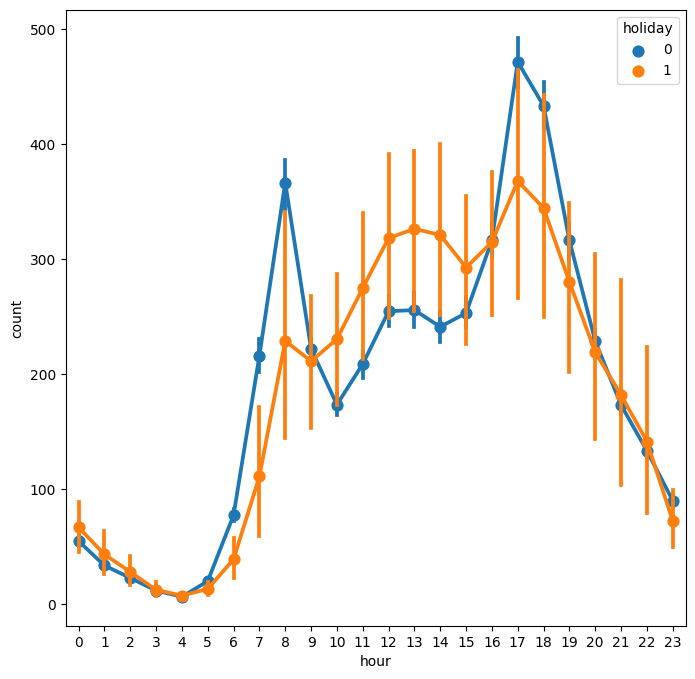

In [67]:
plt.figure(figsize=(8,8))
sns.pointplot(data=train, x='hour', y=train['count'], hue='holiday');


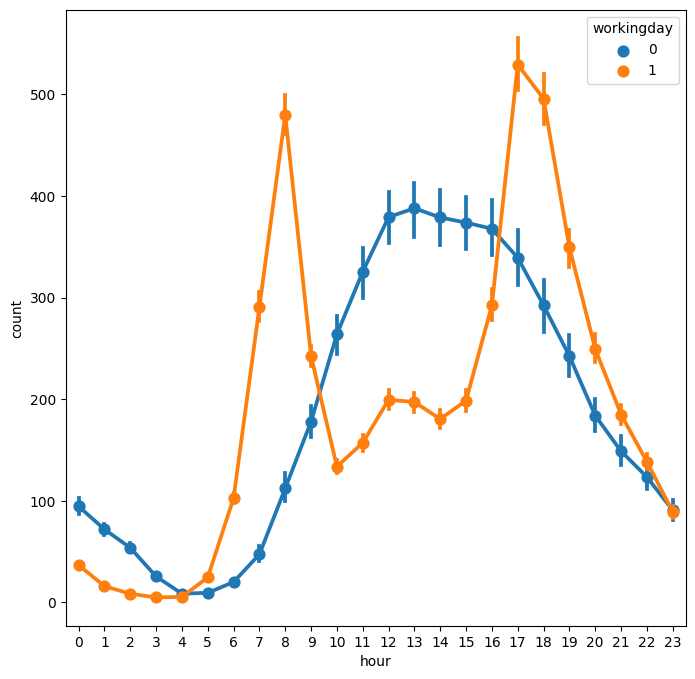

In [66]:
plt.figure(figsize=(8,8))
sns.pointplot(data=train, x='hour', y=train['count'], hue='workingday');

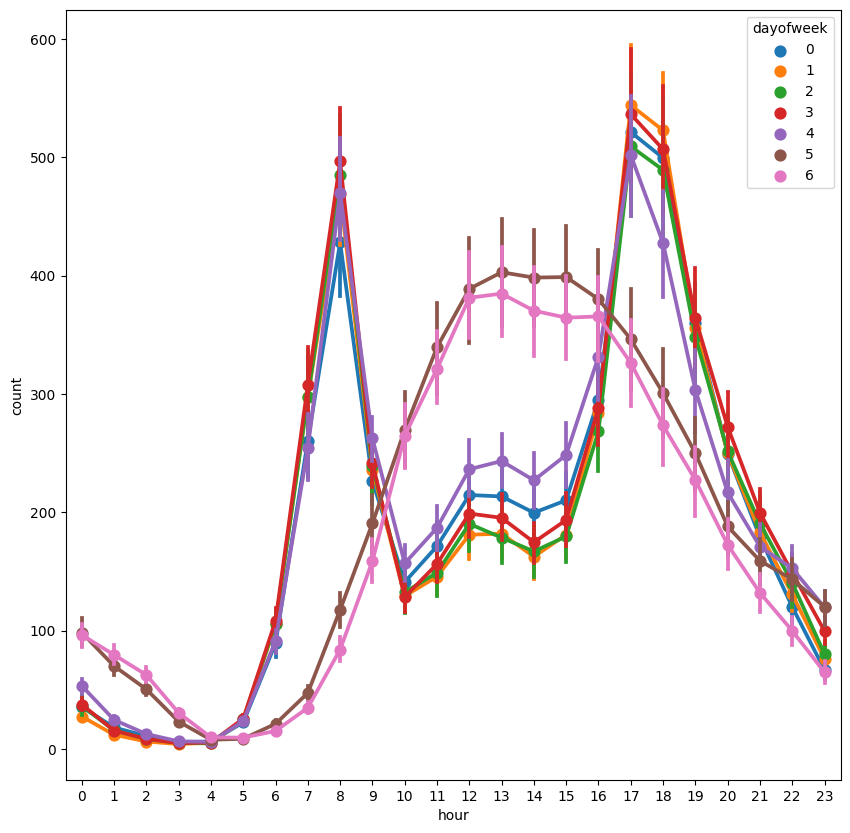

In [64]:
plt.figure(figsize=(10,10))
sns.pointplot(data=train, x='hour', y=train['count'], hue='dayofweek');

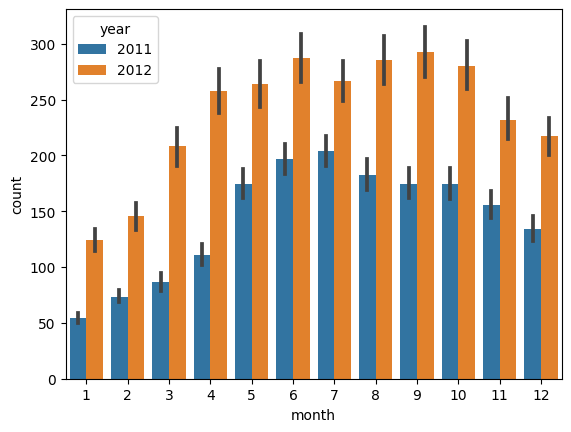

In [71]:
sns.barplot(data=train, x='month', y=train['count'], hue='year');

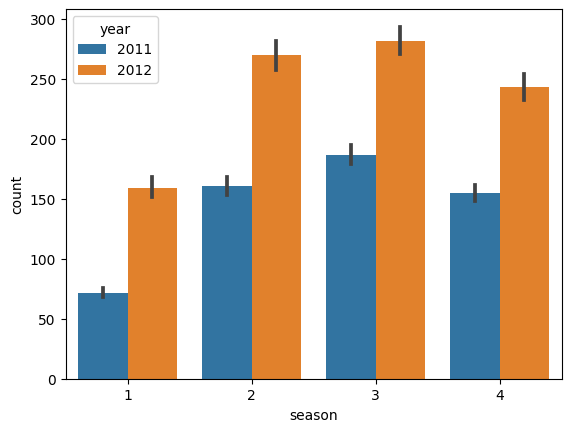

In [70]:
sns.barplot(data=train, x='season', y=train['count'], hue='year');